---
# **Project** : **Hand Guestures Detection in Video**
---
### ---> **Sahil Kumar 777**

This project performs hands guesture recognition in real time on a pretrained model. The output can be used to recognize specific hand gestures from a user, and invoke application features that correspond to those gestures.

* **Objective :-** Recognize specific hand guestures
* **Modules :-** openCV, Mediapipe
* **Guestures :-**
> * 0 - UnKnown gesture
> * 1 - Closed fist
> * 2 - Open palm
> * 3 - Pointing up
> * 4 - Thumbs down
> * 5 - Thumbs up
> * 6 - Victory
> * 7 - Love

## Installing important Libraries

In [ ]:
pip install mediapipe

## Defining Results Visualization Function

### Hand Guesture Images Visulaization functions

In [ ]:
# functions to visualize the gesture recognition results.
from matplotlib import pyplot as plt
import mediapipe as mp
from mediapipe.framework.formats import landmark_pb2
import math

plt.rcParams.update({
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.spines.left': False,
    'axes.spines.bottom': False,
    'xtick.labelbottom': False,
    'xtick.bottom': False,
    'ytick.labelleft': False,
    'ytick.left': False,
    'xtick.labeltop': False,
    'xtick.top': False,
    'ytick.labelright': False,
    'ytick.right': False
})

mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles


def display_one_image(image, title, subplot, titlesize=16):
    """Displays one image along with the predicted category name and score."""
    plt.subplot(*subplot)
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize), color='black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)


def display_batch_of_images_with_gestures_and_hand_landmarks(images, results):
    """Displays a batch of images with the gesture category and its score along with the hand landmarks."""
    # Images and labels.
    imageList = [image.numpy_view() for image in images]
    gestures = [top_gesture for (top_gesture, _) in results]
    multi_hand_landmarks_list = [multi_hand_landmarks for (_, multi_hand_landmarks) in results]

    # Auto-squaring: this will drop data that does not fit into square or square-ish rectangle.
    rows = int(math.sqrt(len(imageList)))
    cols = len(images) // rows

    # Size and spacing.
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols, 1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))

    # Display gestures and hand landmarks.
    for i, (image, gestures) in enumerate(zip(imageList[:rows*cols], gestures[:rows*cols])):
        title = f"{gestures.category_name} ({gestures.score:.2f})"
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols) * 40 + 3
        annotated_image = image.copy()

        for hand_landmarks in multi_hand_landmarks_list[i]:
          hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
          hand_landmarks_proto.landmark.extend([
            landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
          ])

          mp_drawing.draw_landmarks(
            annotated_image,
            hand_landmarks_proto,
            mp_hands.HAND_CONNECTIONS,
            mp_drawing_styles.get_default_hand_landmarks_style(),
            mp_drawing_styles.get_default_hand_connections_style())

        subplot = display_one_image(annotated_image, title, subplot, titlesize=dynamic_titlesize)

    # Layout.
    plt.tight_layout()
    plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()

### Generete and Save Video from ImageList after drawing Hand Gestures

In [ ]:
# Convert To Video

import cv2
import mediapipe as mp

def video_from_images_and_Handguestures(filename,images,results) :
  """ Function to generate video from list of images and their recognised hand guestures. It returns filename """
  mp_hands = mp.solutions.hands
  mp_drawing = mp.solutions.drawing_utils
  mp_drawing_styles = mp.solutions.drawing_styles

  imagesList = [image.numpy_view() for image in images]
  gestures = [top_gesture for (top_gesture, _) in results]
  multi_hand_landmarks_list = [multi_hand_landmarks for (_, multi_hand_landmarks) in results]

  # Define the codec and create a VideoWriter object
  # filename = 'genVideo1.webm'
  fourcc = cv2.VideoWriter_fourcc(*'VP80')  # Can use other codecs like 'mp4v' (for .mp4 files) but mp4 converted files are not supported by coalb and browsers
  fps = 30  # Frames per second
  height, width, _ = imagesList[0].shape

  # Open VideoWriter
  video_writer =  cv2.VideoWriter(filename, fourcc, fps, (width, height))

  # Display gestures and hand landmarks.
  for i, (image, gestures) in enumerate(zip(imagesList, gestures)):
    title = f"{gestures.category_name} ({gestures.score:.2f})"
    #dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols) * 40 + 3
    annotated_image = image.copy()

    for hand_landmarks in multi_hand_landmarks_list[i]:
      if hand_landmarks !=[] :
        hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
        hand_landmarks_proto.landmark.extend([
          landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
        ])

        mp_drawing.draw_landmarks(
          annotated_image,
          hand_landmarks_proto,
          mp_hands.HAND_CONNECTIONS,
          mp_drawing_styles.get_default_hand_landmarks_style(),
          mp_drawing_styles.get_default_hand_connections_style())

    # Add text to the image
    # cv2.putText(image, text, position, font, font_scale, color, thickness)
    cv2.putText(annotated_image, title, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

    video_writer.write(annotated_image)

  video_writer.release() # Closes VideoWriter
  return filename

### Function to Play Video In Colab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def play_video_in_colab(filepath) :

  with open(filepath,'rb') as file :
    mp4 = file.read()
    data_url = "data:video/"+ filepath.split('.')[-1] +";base64,"  + b64encode(mp4).decode()

  return HTML("""
    <video src="%s" type="video/webm" width="640" height="480" controls autoplay>
    </video>
  """  % data_url)

## Image Gesture recognition


In [ ]:
!wget -q https://storage.googleapis.com/mediapipe-models/gesture_recognizer/gesture_recognizer/float16/1/gesture_recognizer.task

In [ ]:
model_path = 'gesture_recognizer.task'

In [ ]:
import cv2
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from mediapipe.tasks.python.components.containers.category import Category

BaseOptions = mp.tasks.BaseOptions
GestureRecognizer = mp.tasks.vision.GestureRecognizer
GestureRecognizerOptions = mp.tasks.vision.GestureRecognizerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Create a gesture recognizer instance with the video mode:
options = GestureRecognizerOptions(base_options=BaseOptions(model_asset_path='gesture_recognizer.task'),running_mode=VisionRunningMode.IMAGE)

recognizer =GestureRecognizer.create_from_options(options)

In [ ]:
cap = cv2.VideoCapture('InputVideo.mp4')

images=[]
results=[]
i=0
while cap.isOpened():
  success,frame = cap.read();
  if not success :
    print('Empty frame')
    break

  frame = cv2.flip(frame, 1)
  mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame)


  # STEP 4: Recognize gestures in the input image.
  recognition_result = recognizer.recognize(mp_image)

  # STEP 5: Process the result. In this case, visualize it.
  if recognition_result.handedness!=[] :
    images.append(mp_image)
    top_gesture = recognition_result.gestures[0][0]
    hand_landmarks = recognition_result.hand_landmarks
    results.append((top_gesture, hand_landmarks))
  else :
    images.append(mp_image)
    top_gesture = Category(index=-1, score=0.00, display_name='', category_name='None')
    hand_landmarks = recognition_result.hand_landmarks
    results.append((top_gesture, hand_landmarks))
  #i+=1

cap.release()


Empty frame


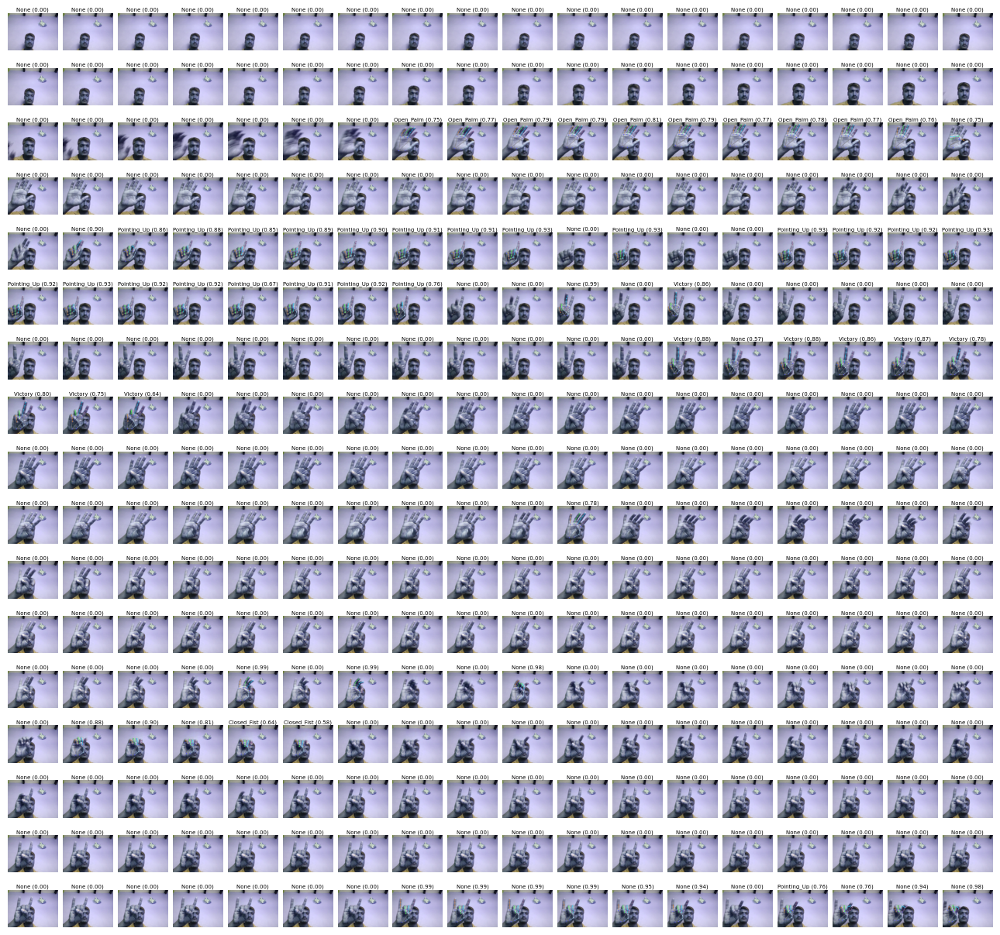

In [ ]:
display_batch_of_images_with_gestures_and_hand_landmarks(images, results)

In [ ]:
video_from_images_and_Handguestures('OutputVideo.webm',images,results)

'OutputVideo.webm'

In [ ]:
play_video_in_colab('OutputVideo.webm')

## Video Gesture recognition


In [ ]:
# Load the pre trained model
!wget -q https://storage.googleapis.com/mediapipe-models/gesture_recognizer/gesture_recognizer/float16/1/gesture_recognizer.task

In [ ]:
import cv2
import mediapipe as mp
from mediapipe.tasks.python.components.containers.category import Category

# Initializing the recogniser options
BaseOptions = mp.tasks.BaseOptions
GestureRecognizer = mp.tasks.vision.GestureRecognizer
GestureRecognizerOptions = mp.tasks.vision.GestureRecognizerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Create a gesture recognizer instance with the video mode:
options = GestureRecognizerOptions(base_options=BaseOptions(model_asset_path='gesture_recognizer.task'),running_mode=VisionRunningMode.VIDEO)


In [ ]:
### Guesture Recognition and Handpints Detection

# STEP 1: Initialize the recogniser
with GestureRecognizer.create_from_options(options) as recognizer:

  # STEP 2: Intialize the video capturing into frames
  cap = cv2.VideoCapture('InputVideo.mp4')
  fps = cap.get(cv2.CAP_PROP_FPS)
  images=[]
  results=[]
  i=0

  while cap.isOpened():

    # STEP 3: Read the frames one by one
    success,frame = cap.read();

    if not success :
      if i==0:
        print('Empty frame')
      else :
        print('Recognition Completed')
        print('Total Frames : ',i)
      break

    frame_timestamp_ms = int(cap.get(cv2.CAP_PROP_POS_MSEC)) # Get timestamp of the frame
    frame = cv2.flip(frame, 1) # flip the frame

    # Convert the frame received from OpenCV to a MediaPipe’s Image object.
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame)

    # STEP 4: Recognize gestures in the input image.
    gesture_recognition_result = recognizer.recognize_for_video(mp_image,frame_timestamp_ms)

    # STEP 5: Process the result. In this case, visualize it.
    if gesture_recognition_result.handedness !=[] :
      images.append(mp_image)
      top_gesture = gesture_recognition_result.gestures[0][0]
      hand_landmarks = gesture_recognition_result.hand_landmarks
      results.append((top_gesture, hand_landmarks))
    else :
      images.append(mp_image)
      top_gesture = Category(index=-1, score=0.00, display_name='', category_name='None')
      hand_landmarks = gesture_recognition_result.hand_landmarks
      results.append((top_gesture, hand_landmarks))

    i+=1

  cap.release()


Recognition Completed
Total Frames :  317


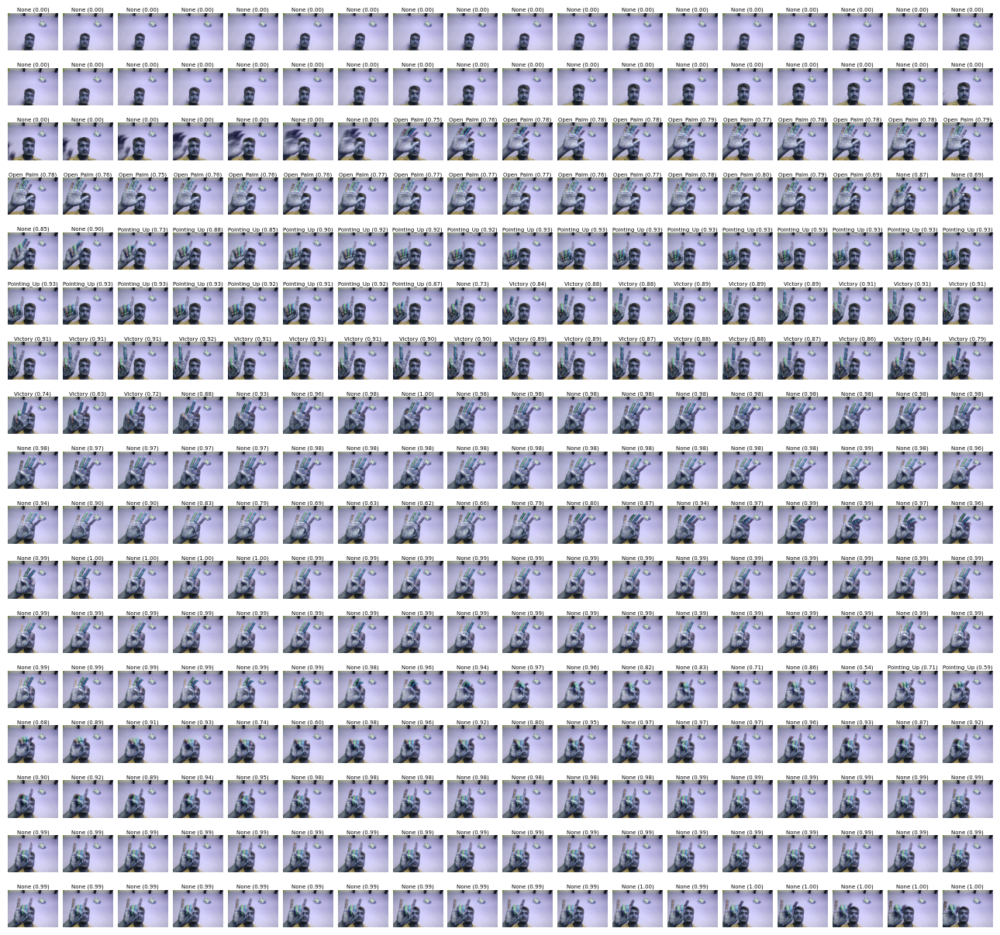

In [ ]:
display_batch_of_images_with_gestures_and_hand_landmarks(images, results)

In [ ]:
video_from_images_and_Handguestures('OutputVideo1.webm',images,results)

'OutputVideo1.webm'

In [ ]:
play_video_in_colab('OutputVideo1.webm')